In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df_train = pd.read_csv('./cleaned_data/train_cleaned.csv')
df_test = pd.read_csv('./cleaned_data/test_cleaned.csv')

In [3]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402799 entries, 0 to 402798
Data columns (total 59 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   房屋曾出租過          402799 non-null  int64  
 1   押金月數            402799 non-null  float64
 2   需要管理費？          402799 non-null  int64  
 3   月管理費            402799 non-null  float64
 4   提供車位？           402799 non-null  int64  
 5   需要停車費？          402799 non-null  int64  
 6   月停車費            402799 non-null  int64  
 7   物件類型            402799 non-null  int64  
 8   自報頂加？           402799 non-null  int64  
 9   所在樓層            402799 non-null  int64  
 10  建物樓高            402799 non-null  int64  
 11  距頂樓層數           402799 non-null  int64  
 12  坪數              402799 non-null  float64
 13  陽台數             402799 non-null  float64
 14  衛浴數             402799 non-null  float64
 15  房數              402799 non-null  float64
 16  客廳數             402799 non-null  float64
 17  額外費用_電費？  

In [4]:
train_price = df_train['月租金']  

print("\nTraining Data Price Statistics:")
print(train_price.describe())



Training Data Price Statistics:
count    402799.000000
mean      15379.413755
std       13087.690212
min        1000.000000
25%        6800.000000
50%       10999.000000
75%       20000.000000
max       90000.000000
Name: 月租金, dtype: float64


In [5]:
test_price = df_test['月租金']  

print("\nTest Data Price Statistics:")
print(test_price.describe())



Test Data Price Statistics:
count    100700.000000
mean      15364.061619
std       13100.303432
min        1000.000000
25%        6800.000000
50%       10999.000000
75%       19800.000000
max       90000.000000
Name: 月租金, dtype: float64


In [6]:
df_test.isnull().sum()

房屋曾出租過            0
押金月數              0
需要管理費？            0
月管理費              0
提供車位？             0
需要停車費？            0
月停車費              0
物件類型              0
自報頂加？             0
所在樓層              0
建物樓高              0
距頂樓層數             0
坪數                0
陽台數               0
衛浴數               0
房數                0
客廳數               0
額外費用_電費？          0
額外費用_水費？          0
額外費用_瓦斯？          0
額外費用_網路？          0
額外費用_第四台？         0
附近有_學校？           0
附近有_公園？           0
附近有_百貨公司？         0
附近有_超商？           0
附近有_傳統市場？         0
附近有_夜市？           0
附近有_醫療機構？         0
附近的捷運站數           0
附近的公車站數           0
附近的火車站數           0
附近的高鐵站數           0
附近的公共自行車數（實驗中）    0
有身份限制？            0
有性別限制？            0
性別限制              0
可炊？               0
可寵？               0
有產權登記？            0
刊登者類型             0
提供家具_床？           0
提供家具_桌子？          0
提供家具_椅子？          0
提供家具_電視？          0
提供家具_熱水器？         0
提供家具_冷氣？          0
提供家具_沙發？          0
提供家具_洗衣機？         0
提供家具_衣櫃？          0


In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100700 entries, 0 to 100699
Data columns (total 59 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   房屋曾出租過          100700 non-null  int64  
 1   押金月數            100700 non-null  float64
 2   需要管理費？          100700 non-null  int64  
 3   月管理費            100700 non-null  float64
 4   提供車位？           100700 non-null  int64  
 5   需要停車費？          100700 non-null  int64  
 6   月停車費            100700 non-null  int64  
 7   物件類型            100700 non-null  int64  
 8   自報頂加？           100700 non-null  int64  
 9   所在樓層            100700 non-null  int64  
 10  建物樓高            100700 non-null  int64  
 11  距頂樓層數           100700 non-null  int64  
 12  坪數              100700 non-null  float64
 13  陽台數             100700 non-null  float64
 14  衛浴數             100700 non-null  float64
 15  房數              100700 non-null  float64
 16  客廳數             100700 non-null  float64
 17  額外費用_電費？  

In [8]:
#df_test = df_test.drop(columns = ['最大刊登者編碼','約略地點範圍'])

In [9]:
# 分割特徵和目標變數
X = df_train.drop(columns=['月租金'])  # 去除目標變數和異常標籤
y = df_train['月租金']

# 切分數據集為訓練集和測試集
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1919810)


In [10]:
#可以看出，特徵數量很多，這裡我選擇使用t-SNE的方式做維度縮減


In [11]:
from matplotlib.font_manager import FontManager
fm = FontManager()
mat_fonts = set(f.name for f in fm.ttflist)
print(mat_fonts)

{'STIXGeneral', 'Noto Sans Mongolian', 'Noto Sans Tirhuta', 'Damascus', 'Noto Sans Osmanya', 'Noto Serif Hmong Nyiakeng', 'Tahoma', 'Silom', 'Hiragino Maru Gothic Pro', 'Trebuchet MS', 'Times', 'cmsy10', 'Noto Sans Palmyrene', 'Kohinoor Devanagari', 'DejaVu Sans Mono', 'Noto Sans New Tai Lue', '.SF Arabic Rounded', 'Arial Rounded MT Bold', 'Kailasa', 'Noto Sans Lydian', 'Khmer MN', 'Noto Sans Adlam', 'Thonburi', 'Malayalam Sangam MN', 'Beirut', '.SF Hebrew Rounded', 'Hiragino Mincho ProN', 'Noto Sans Old Italic', 'Al Bayan', 'Noto Sans Caucasian Albanian', 'Ubuntu Condensed', 'DejaVu Serif Display', 'Herculanum', 'Noto Sans Mandaic', 'Chalkboard SE', 'Waseem', 'Noto Sans Tai Le', 'Farah', 'Noto Sans Thaana', 'Khmer Sangam MN', 'Noto Sans Siddham', 'Noto Sans Old North Arabian', 'STIXIntegralsD', 'Noto Sans Chakma', 'cmmi10', 'PT Serif Caption', 'cmtt10', '.SF Soft Numeric', 'Noto Sans Takri', 'PT Mono', '.SF Camera', 'System Font', 'cmss10', 'Noto Sans Batak', '.SF Arabic', 'Noto Sans 

# try 1: 非線性降維 - T-SNE
因為特徵間可能並不具有線性關係，先使用t-SNE降維

因為樣本數較多，使用普通t-SNE 需要龐大的運算資源，我選擇使用 openTSNE 來優化效率


In [12]:
#!pip install openTSNE

In [13]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402799 entries, 0 to 402798
Data columns (total 59 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   房屋曾出租過          402799 non-null  int64  
 1   押金月數            402799 non-null  float64
 2   需要管理費？          402799 non-null  int64  
 3   月管理費            402799 non-null  float64
 4   提供車位？           402799 non-null  int64  
 5   需要停車費？          402799 non-null  int64  
 6   月停車費            402799 non-null  int64  
 7   物件類型            402799 non-null  int64  
 8   自報頂加？           402799 non-null  int64  
 9   所在樓層            402799 non-null  int64  
 10  建物樓高            402799 non-null  int64  
 11  距頂樓層數           402799 non-null  int64  
 12  坪數              402799 non-null  float64
 13  陽台數             402799 non-null  float64
 14  衛浴數             402799 non-null  float64
 15  房數              402799 non-null  float64
 16  客廳數             402799 non-null  float64
 17  額外費用_電費？  

In [ ]:
df = df_train.copy()
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
features = [
            '附近的捷運站數', '附近的公車站數', '附近的火車站數', '附近的高鐵站數',
            '附近的公共自行車數（實驗中）']

X = df[features]

X_scaled = StandardScaler().fit_transform(X)

X_scaled = X_scaled.astype('float32')

tsne = TSNE(n_jobs=4, random_state=1919)  # 使用4个CPU核

X_tsne = tsne.fit(X_scaled)  
X_tsne = tsne.transform(X_scaled)  


y = df['月租金']

plt.figure(figsize=(10, 8))

plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms']

scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap='viridis', alpha=0.5)
plt.title('t-SNE 降维结果＆月租金')
plt.xlabel('t-SNE 维度 1')
plt.ylabel('t-SNE 维度 2')

plt.colorbar(scatter, label='月租金')

plt.show()


群集結構：

圖中顯示出明顯的群集結構，代表不同資料點的特徵在高維空間中具有相似性。
t-SNE 的目的是將高維空間中距離接近的點投影至二維平面，因此可以解釋為有類似「額外費用」和「家具提供」條件的房屋聚集在一起。
顏色與數值關聯：

圖中的顏色由深紫色（低租金）到黃色（高租金）漸變，表明「月租金」在這些特徵群集中呈現出某些趨勢。
一些群集可能對應特定的房屋條件（如家具和額外費用），導致租金較高或較低。
群集位置：

中心位置的群集可能包含特徵值最具普遍性的資料（例如標準化後的特徵接近平均值），而邊緣群集可能是特徵異常的資料。
噪聲與分佈邊界：

圖中的零星點分佈可能是一些不常見的組合條件或數據異常，值得進一步檢查。

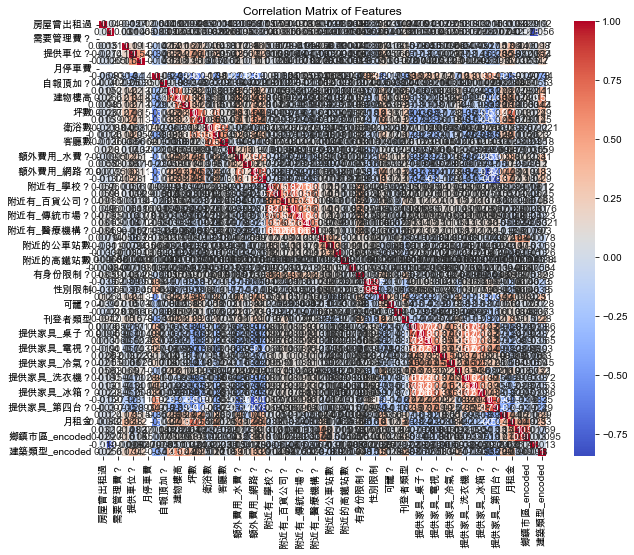

In [16]:
from matplotlib.font_manager import FontProperties

plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms']

df_con = df_train
#用heatmap看相關性
corr = df_con.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Features')
plt.show()

## Decision Tree

In [17]:
df = df_train.copy()
#df = df.drop(columns = ['額外費用_電費？', '額外費用_水費？', '額外費用_瓦斯？', '額外費用_網路？','tSNE_b1','tSNE_b2', '額外費用_第四台？','提供家具_床？','提供家具_桌子？','提供家具_椅子？','提供家具_電視？','提供家具_熱水器？','提供家具_冷氣？','提供家具_沙發？','提供家具_洗衣機？','提供家具_衣櫃？','提供家具_冰箱？','提供家具_網路？','提供家具_第四台？','提供家具_天然瓦斯？'])

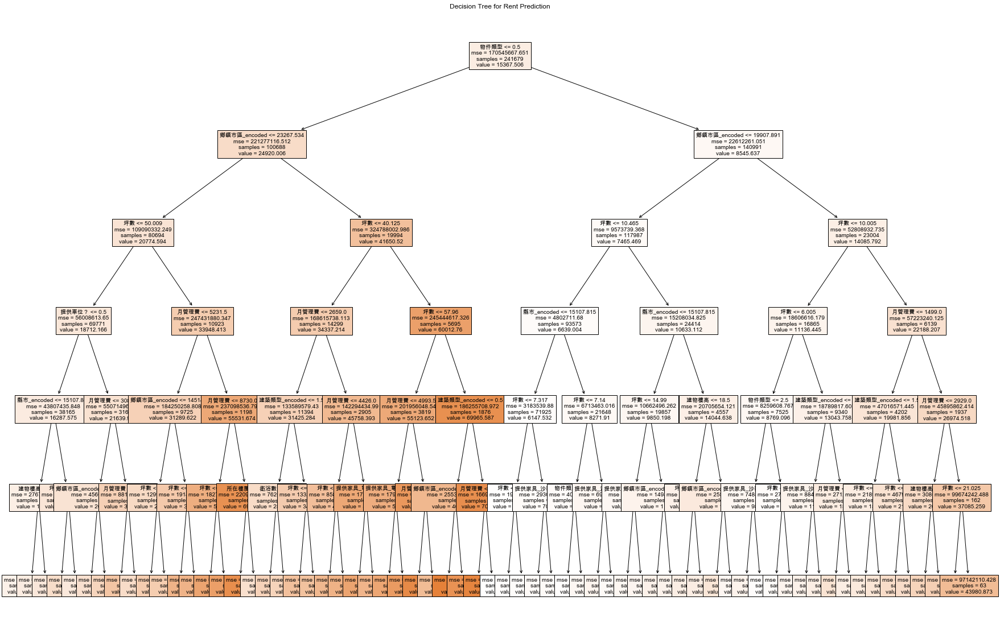

In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
import matplotlib.pyplot as plt

# 篩選特徵與目標
predictors = df.columns.drop('月租金').tolist()
target = '月租金'

# 分割資料集

X = df[predictors]
y = df[target]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.4, random_state=114514)


# 建立決策樹模型
tree_model = DecisionTreeRegressor(max_depth=6, random_state=1919)
tree_model.fit(X_train, y_train)

# 繪製決策樹
plt.figure(figsize=(30, 20))
plot_tree(tree_model, feature_names=predictors, filled=True, fontsize=10)
plt.title("Decision Tree for Rent Prediction", fontsize=12)
plt.show()


In [19]:
# 預測訓練集、驗證集、測試集
from sklearn.metrics import mean_squared_error, r2_score

X_test = df_test[predictors]
y_test = df_test['月租金']

y_train_pred = tree_model.predict(X_train)
y_val_pred = tree_model.predict(X_val)
y_test_pred = tree_model.predict(X_test)

# 定義計算指標的函數
def evaluate(y_true, y_pred, dataset_name):
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"{dataset_name} Scores:")
    print(f"  R²: {r2:.4f}")
    print(f"  MSE: {mse:.4f}")
    print(f"  RMSE: {rmse:.4f}\n")

# 計算各集的分數
evaluate(y_train, y_train_pred, "Training")
evaluate(y_val, y_val_pred, "Validation")
evaluate(y_test, y_test_pred, "Testing")


Training Scores:
  R²: 0.8249
  MSE: 29854672.4247
  RMSE: 5463.9429

Validation Scores:
  R²: 0.8235
  MSE: 30424574.4897
  RMSE: 5515.8476

Testing Scores:
  R²: 0.8210
  MSE: 30715510.8717
  RMSE: 5542.1576



In [20]:
from sklearn.tree import export_text
tree_rules = export_text(tree_model, feature_names=predictors)
print(tree_rules)

|--- 物件類型 <= 0.50
|   |--- 鄉鎮市區_encoded <= 23267.53
|   |   |--- 坪數 <= 50.01
|   |   |   |--- 提供車位？ <= 0.50
|   |   |   |   |--- 縣市_encoded <= 15107.81
|   |   |   |   |   |--- 建物樓高 <= 8.50
|   |   |   |   |   |   |--- value: [12773.67]
|   |   |   |   |   |--- 建物樓高 >  8.50
|   |   |   |   |   |   |--- value: [15843.30]
|   |   |   |   |--- 縣市_encoded >  15107.81
|   |   |   |   |   |--- 坪數 <= 34.00
|   |   |   |   |   |   |--- value: [18415.04]
|   |   |   |   |   |--- 坪數 >  34.00
|   |   |   |   |   |   |--- value: [24706.06]
|   |   |   |--- 提供車位？ >  0.50
|   |   |   |   |--- 月管理費 <= 3082.50
|   |   |   |   |   |--- 鄉鎮市區_encoded <= 12938.59
|   |   |   |   |   |   |--- value: [17878.79]
|   |   |   |   |   |--- 鄉鎮市區_encoded >  12938.59
|   |   |   |   |   |   |--- value: [22446.06]
|   |   |   |   |--- 月管理費 >  3082.50
|   |   |   |   |   |--- 月管理費 <= 4263.00
|   |   |   |   |   |   |--- value: [29077.60]
|   |   |   |   |   |--- 月管理費 >  4263.00
|   |   |   |   |   |   |--- value: [3

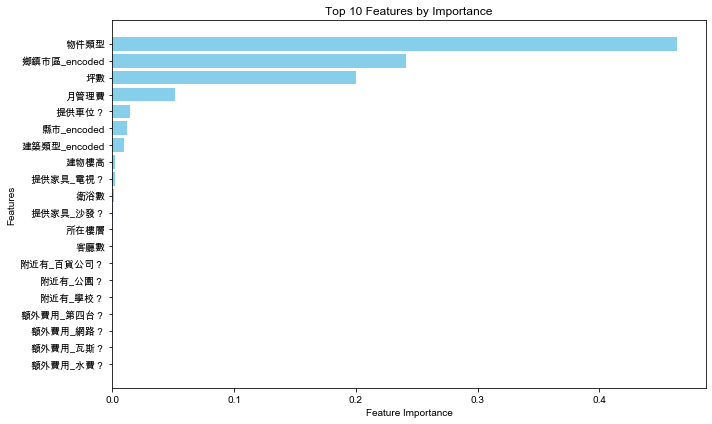

In [21]:
# 獲取特徵重要性
feature_importances = tree_model.feature_importances_

# 將特徵與其重要性排序
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_features = [predictors[i] for i in sorted_indices]
sorted_importances = feature_importances[sorted_indices]

#取前 20 名特徵
top_10_features = sorted_features[:20]
top_10_importances = sorted_importances[:20]

# 繪製條形圖
plt.figure(figsize=(10, 6))
plt.barh(top_10_features[::-1], top_10_importances[::-1], color='skyblue')  # 翻轉順序以將最重要的特徵置頂
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Top 10 Features by Importance')
plt.tight_layout()
plt.show()

根據一般決策樹模型結果，物件類型的information gain最高，代表此模型將「物件類型」視為區分能力最強的特徵。
其中，物件類型<=0.5的編碼是0:「整層住家」，而其他類型的物件（像是獨立套房、分租套房）的租金就會較低。

而第二重要的特徵為「鄉鎮市區」，這很直觀，因為鄉鎮市區的編碼方式是target encoding，這代表說當你今天房屋所在區的平均租金越高，你的房屋往往也能有較高的租金。
第三重要的特徵是坪數，這很直觀，坪數越大，租金越高。
第四重要的特徵是月管理費，我們推測是因為通常租金較高的房屋，會被收取較高的管理費。
第五重要的特徵是是否有停車位，＃解釋。


## Random Forest(Bagging+Decision tree)

In [22]:
from sklearn.ensemble import RandomForestRegressor

# 假設 df 已經存在並且是完整的數據集
predictors = df.columns.drop('月租金').tolist()  # 移除目標變數
target = '月租金'

X = df[predictors]
y = df[target]

# 訓練集和測試集分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


# 創建隨機森林回歸模型
rf_model = RandomForestRegressor(
    n_estimators=100,           # 樹的數量（預設=100），增加此數量有助於提升準確性，但會增加計算時間
    max_depth=10,               # 樹的最大深度
    min_samples_split=10,        # 每個內部節點所需的最小樣本數，較大會減少模型複雜度
    min_samples_leaf=2,         # 每個葉子節點所需的最小樣本數（預設=1）
    max_features='auto',        # 每棵樹隨機選擇的最大特徵數，'auto' 表示 sqrt(n_features)
    bootstrap=True,             # 是否使用自助法（默認=True），即每棵樹都是在隨機選擇的訓練集上訓練
    random_state=810,            # 隨機數種子，設置這個可以保證每次運行結果一致
    n_jobs=-1,                  # 設置並行訓練的工作數量，-1 表示使用所有處理器核心
    warm_start=False,           # 是否啟用 warm start，即是否在之前的訓練基礎上增長樹的數量
)
# 訓練模型
rf_model.fit(X_train, y_train)


X_test = df_test[predictors]
y_test = df_test['月租金']

y_train_pred = rf_model.predict(X_train)
y_val_pred = rf_model.predict(X_val)
y_test_pred = rf_model.predict(X_test)


# 計算各集的分數
evaluate(y_train, y_train_pred, "Training")
evaluate(y_val, y_val_pred, "Validation")
evaluate(y_test, y_test_pred, "Testing")


Training Scores:
  R²: 0.8920
  MSE: 18544960.1829
  RMSE: 4306.3860

Validation Scores:
  R²: 0.8876
  MSE: 19376624.5037
  RMSE: 4401.8887

Testing Scores:
  R²: 0.8799
  MSE: 20612740.0815
  RMSE: 4540.1256



In [23]:

# 顯示特徵的重要性（隨機森林中為特徵的重要性）
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': rf_model.feature_importances_
})

print(feature_importance)


           Feature  Importance
0           房屋曾出租過    0.000209
1             押金月數    0.000085
2           需要管理費？    0.000000
3             月管理費    0.054927
4            提供車位？    0.012539
5           需要停車費？    0.000100
6             月停車費    0.000000
7             物件類型    0.365547
8            自報頂加？    0.000027
9             所在樓層    0.001711
10            建物樓高    0.010860
11           距頂樓層數    0.001823
12              坪數    0.269849
13             陽台數    0.000405
14             衛浴數    0.004348
15              房數    0.001515
16             客廳數    0.000753
17        額外費用_電費？    0.000209
18        額外費用_水費？    0.000033
19        額外費用_瓦斯？    0.000018
20        額外費用_網路？    0.000058
21       額外費用_第四台？    0.000038
22         附近有_學校？    0.000034
23         附近有_公園？    0.000031
24       附近有_百貨公司？    0.000096
25         附近有_超商？    0.000040
26       附近有_傳統市場？    0.000044
27         附近有_夜市？    0.000054
28       附近有_醫療機構？    0.000037
29         附近的捷運站數    0.000262
30         附近的公車站數    0.000121
31      

In [24]:
# 按照重要性排序
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# 顯示排序後的特徵重要性
print(feature_importance)

           Feature  Importance
7             物件類型    0.365547
12              坪數    0.269849
55    鄉鎮市區_encoded    0.230975
3             月管理費    0.054927
54      縣市_encoded    0.020903
57    建築類型_encoded    0.012800
4            提供車位？    0.012539
10            建物樓高    0.010860
14             衛浴數    0.004348
44        提供家具_電視？    0.003784
11           距頂樓層數    0.001823
47        提供家具_沙發？    0.001753
9             所在樓層    0.001711
15              房數    0.001515
53      提供家具_天然瓦斯？    0.001016
40           刊登者類型    0.000908
16             客廳數    0.000753
13             陽台數    0.000405
37             可炊？    0.000308
49        提供家具_衣櫃？    0.000303
29         附近的捷運站數    0.000262
48       提供家具_洗衣機？    0.000226
50        提供家具_冰箱？    0.000217
17        額外費用_電費？    0.000209
0           房屋曾出租過    0.000209
41         提供家具_床？    0.000155
43        提供家具_椅子？    0.000148
30         附近的公車站數    0.000121
42        提供家具_桌子？    0.000105
5           需要停車費？    0.000100
46        提供家具_冷氣？    0.000098
24      

可以看出，使用bagging + decision tree的方式與原本一顆decision的特徵重要性排序是差不多的，「提供車位？」的重要性降低

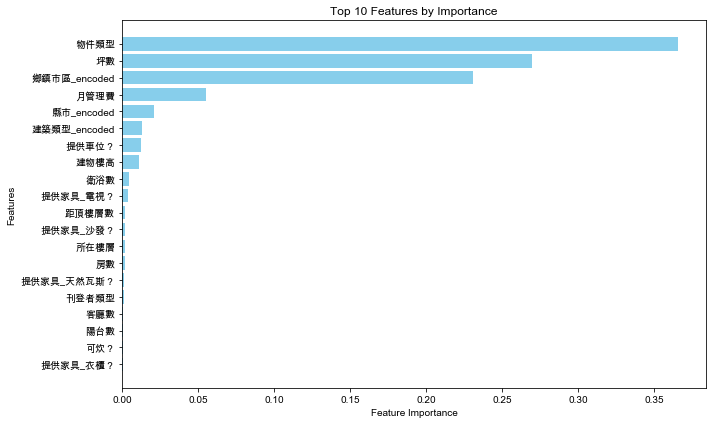

In [25]:

feature_importances = rf_model.feature_importances_

# 將特徵與其重要性排序
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_features = [predictors[i] for i in sorted_indices]
sorted_importances = feature_importances[sorted_indices]

#取前 20 名特徵
top_10_features = sorted_features[:20]
top_10_importances = sorted_importances[:20]

# 繪製條形圖
plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms']

plt.figure(figsize=(10, 6))
plt.barh(top_10_features[::-1], top_10_importances[::-1], color='skyblue')  # 翻轉順序以將最重要的特徵置頂
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Top 10 Features by Importance')
plt.tight_layout()
plt.show()

## XGboost (method:Gradient boost + Decision Tree)

In [26]:
#用XGBoost模型預測，使用一般t-SNE降維
import xgboost as xgb

predictors = df.columns.drop('月租金').tolist()
target = '月租金'

X = df[predictors]
y = df[target]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=114514)

#因為使用XGBoost模型，所以轉換成 DMatrix格式
dtrain = xgb.DMatrix(X_train, label=y_train)
dvalid = xgb.DMatrix(X_val, label=y_val)

[0]	train-rmse:12144.18222	valid-rmse:12276.61150
[10]	train-rmse:6189.71421	valid-rmse:6333.57061
[20]	train-rmse:4593.62116	valid-rmse:4774.81694
[30]	train-rmse:4150.81163	valid-rmse:4361.58004
[40]	train-rmse:3961.54098	valid-rmse:4205.90754
[50]	train-rmse:3852.99364	valid-rmse:4121.55548
[60]	train-rmse:3781.37099	valid-rmse:4072.59228
[70]	train-rmse:3725.02747	valid-rmse:4037.25937
[80]	train-rmse:3670.02676	valid-rmse:4005.93991
[90]	train-rmse:3630.98955	valid-rmse:3984.29167
[100]	train-rmse:3580.53438	valid-rmse:3954.22774
[110]	train-rmse:3543.19375	valid-rmse:3935.42892
[120]	train-rmse:3505.55067	valid-rmse:3917.44384
[130]	train-rmse:3464.85349	valid-rmse:3895.72919
[140]	train-rmse:3436.37698	valid-rmse:3879.20126
[150]	train-rmse:3402.42393	valid-rmse:3860.83869
[160]	train-rmse:3373.13081	valid-rmse:3847.56760
[170]	train-rmse:3340.87239	valid-rmse:3835.01149
[180]	train-rmse:3313.71191	valid-rmse:3824.61929
[190]	train-rmse:3290.73759	valid-rmse:3816.56592
[200]	tra

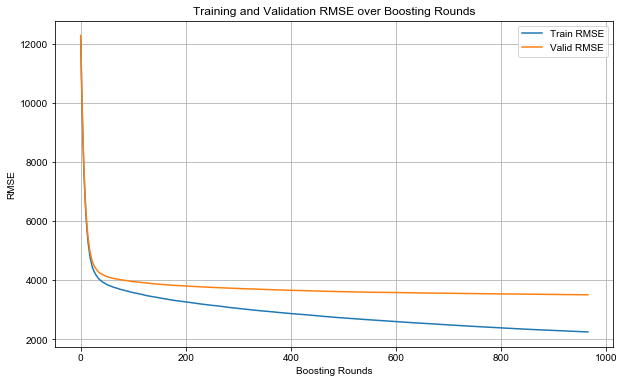

In [27]:
# 調整的 XGBoost 參數
params = {
    'objective': 'reg:squarederror',
    'max_depth': 8,
    'gamma': 0.5,
    'learning_rate': 0.1,
    'subsample': 0.5,
    'colsample_bytree': 0.7,
    'lambda': 2
}

# 訓練模型並記錄評估結果
evals_result = {}
evals = [(dtrain, 'train'), (dvalid, 'valid')]

xgb_model = xgb.train(
    params,
    dtrain,
    num_boost_round=1500,              # 增加迭代次數以適應更低的學習率
    evals=evals,
    early_stopping_rounds=10,         # 如果 10 次迭代內驗證集損失無下降，則提前停止
    evals_result=evals_result,        # 記錄損失
    verbose_eval=10                   # 每 10 次輸出一次損失
)

# 繪製損失函數圖
train_rmse = evals_result['train']['rmse']
valid_rmse = evals_result['valid']['rmse']

plt.figure(figsize=(10, 6))
plt.plot(train_rmse, label='Train RMSE')
plt.plot(valid_rmse, label='Valid RMSE')
plt.xlabel('Boosting Rounds')
plt.ylabel('RMSE')
plt.title('Training and Validation RMSE over Boosting Rounds')
plt.legend()
plt.grid()
plt.show()


可以看出，有overfitting 的趨勢

In [28]:
X_test = df_test[predictors]
dtest = xgb.DMatrix(X_test)

y_test_actual = df_test['月租金']

y_train_pred = xgb_model.predict(dtrain)
y_valid_pred = xgb_model.predict(dvalid)
y_test_pred = xgb_model.predict(dtest)

evaluate(y_train, y_train_pred, "Training")
evaluate(y_val, y_valid_pred, "Validation")
evaluate(y_test_actual, y_test_pred, "Testing")


Training Scores:
  R²: 0.9702
  MSE: 5066909.2423
  RMSE: 2250.9796

Validation Scores:
  R²: 0.9291
  MSE: 12320944.7400
  RMSE: 3510.1203

Testing Scores:
  R²: 0.9296
  MSE: 12078655.9390
  RMSE: 3475.4361



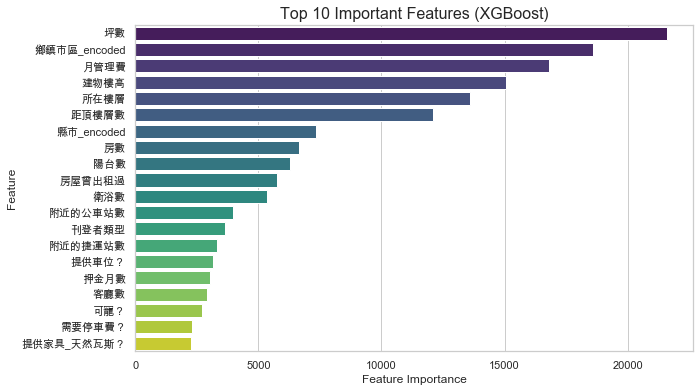

In [29]:
# 顯示特徵重要性
importance = xgb_model.get_score(importance_type='weight')

# 創建 DataFrame 顯示特徵及其重要性
feature_importance = pd.DataFrame({
    'Feature': list(importance.keys()),
    'Importance': list(importance.values())
})

# 根據重要性排序
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# 顯示前20名特徵的重要性
top_10_features = feature_importance.head(20)

import matplotlib.pyplot as plt
import seaborn as sns

# 設定繪圖樣式
sns.set(style="whitegrid")
# 繪製條形圖
plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms']

# 畫出前10名特徵的重要性條形圖
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_10_features, palette='viridis')

# 設定圖標題
plt.title('Top 10 Important Features (XGBoost)', fontsize=16)
plt.xlabel('Feature Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)

# 顯示圖表
plt.show()

可以看出，在XGboost的模型迭代下，坪數是最重要的特徵，比較特殊的是，與樓層相關的特徵重要性要遠高於先前的單一決策樹與隨機森林，這意味著使用Gradient boost + Decision Tree模式的模型認為樓層因素會是影響租金的關鍵因素

In [30]:
# 繪製指定深度的樹
tree_dump = xgb_model.get_dump(with_stats=True)

# 選擇顯示某一棵樹，這裡以第 0 棵樹為例
tree_structure = tree_dump[0]

# 控制樹的深度，限制顯示前幾層（例如，顯示前 8 層）
max_depth = 8

# 這段代碼簡單地截斷顯示樹結構中的前 8 層
lines = tree_structure.split("\n")
limited_tree_structure = "\n".join([line for i, line in enumerate(lines) if i < max_depth * 10])  # 假設每層深度大約有 10 行

# 顯示截斷後的樹結構
print(limited_tree_structure)

0:[物件類型<1] yes=1,no=2,missing=2,gain=9.15433901e+12,cover=141188
	1:[月管理費<3350] yes=3,no=4,missing=4,gain=3.65225207e+12,cover=58867
		3:[坪數<41] yes=7,no=8,missing=8,gain=9.29607451e+11,cover=53480
			7:[月管理費<2080] yes=15,no=16,missing=16,gain=3.02458143e+11,cover=42269
				15:[刊登者類型<2] yes=31,no=32,missing=32,gain=1.23505279e+11,cover=38214
					31:[坪數<25.1380005] yes=63,no=64,missing=64,gain=4.00202957e+10,cover=17302
						63:[建物樓高<7] yes=125,no=126,missing=126,gain=2.25905603e+10,cover=8456
							125:[坪數<13.5] yes=241,no=242,missing=242,gain=7.66778982e+09,cover=4386
								241:leaf=-470.700165,cover=519
								242:leaf=-61.9872704,cover=3867
							126:[坪數<14] yes=243,no=244,missing=244,gain=6.44681933e+09,cover=4070
								243:leaf=-196.814713,cover=344
								244:leaf=254.752792,cover=3726
						64:[坪數<32.4000015] yes=127,no=128,missing=128,gain=1.02552699e+10,cover=8846
							127:[建物樓高<11] yes=245,no=246,missing=246,gain=6.84306432e+09,cover=5424
								245:leaf=174.1387

In [31]:
plt.figure(figsize=(500, 300))

# 繪製第 965 棵树
xgb.plot_tree(xgb_model, num_trees=965, rankdir='LR', ax=plt.gca())
plt.show()

In [32]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100700 entries, 0 to 100699
Data columns (total 59 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   房屋曾出租過          100700 non-null  int64  
 1   押金月數            100700 non-null  float64
 2   需要管理費？          100700 non-null  int64  
 3   月管理費            100700 non-null  float64
 4   提供車位？           100700 non-null  int64  
 5   需要停車費？          100700 non-null  int64  
 6   月停車費            100700 non-null  int64  
 7   物件類型            100700 non-null  int64  
 8   自報頂加？           100700 non-null  int64  
 9   所在樓層            100700 non-null  int64  
 10  建物樓高            100700 non-null  int64  
 11  距頂樓層數           100700 non-null  int64  
 12  坪數              100700 non-null  float64
 13  陽台數             100700 non-null  float64
 14  衛浴數             100700 non-null  float64
 15  房數              100700 non-null  float64
 16  客廳數             100700 non-null  float64
 17  額外費用_電費？  

In [33]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402799 entries, 0 to 402798
Data columns (total 59 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   房屋曾出租過          402799 non-null  int64  
 1   押金月數            402799 non-null  float64
 2   需要管理費？          402799 non-null  int64  
 3   月管理費            402799 non-null  float64
 4   提供車位？           402799 non-null  int64  
 5   需要停車費？          402799 non-null  int64  
 6   月停車費            402799 non-null  int64  
 7   物件類型            402799 non-null  int64  
 8   自報頂加？           402799 non-null  int64  
 9   所在樓層            402799 non-null  int64  
 10  建物樓高            402799 non-null  int64  
 11  距頂樓層數           402799 non-null  int64  
 12  坪數              402799 non-null  float64
 13  陽台數             402799 non-null  float64
 14  衛浴數             402799 non-null  float64
 15  房數              402799 non-null  float64
 16  客廳數             402799 non-null  float64
 17  額外費用_電費？  

In [ ]:
#可以看出，使用經過tSNE降維的特徵表現略優於原本的
